# OPEN AI API : zero shot classification

In [137]:
# select the technology you want to evaluate
# tech_2_use_for_classification='local_clip'
tech_2_use_for_classification='openai_api'
# note ...at this moment this notebook only supports 1 technology, later you will be asked to add another one.

### Setting up your environment

This notebook has been test in an anaconda environment on windows with python 3.12.11 installed
It should run as well on Linux and or with other versions of python as long as the correct packages have been installed.

This notebook is designed to run on a laptop with or without GPU capabilities.
When you have a GPU available :
- pip install cuda-python
- pip install torch torchvision --index-url https://download.pytorch.org/whl/cu124

Otherwise
- pip install torch
- pip install torchvision
- pip install ftfy
- pip install regex

also install kagglehub,
  

In [138]:
test_cuda_support=True
if test_cuda_support :
   import torch
   import subprocess
   print("PyTorch CUDA available ?:", torch.cuda.is_available())
   if torch.cuda.is_available():
       torch.zeros(1).cuda()
       print("CUDA Version:", torch.version.cuda)
       print("Available GPUs:", torch.cuda.device_count())
       print("GPU Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU detected")
       # verify which cuda version you are using
       CUDA_version = [s for s in subprocess.check_output(["nvcc", "--version"]).decode("UTF-8").split(", ") if s.startswith("release")][0].split(" ")[-1]
       print("CUDA version:", CUDA_version)

PyTorch CUDA available ?: True
CUDA Version: 12.6
Available GPUs: 1
GPU Name: Tesla T4
CUDA version: 12.5


In [139]:
# General import section
import sys
import os
import numpy as np
import cv2
import torch
import glob
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import f1_score, accuracy_score
from sklearn.metrics import confusion_matrix # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html
from PIL import Image

### General configuration

In [140]:
verbose=True
visualise=True
visualise_mis_classifications=True

### General helper functions

In [141]:
def displayPerformanceFigures(real,pred,title,classnames,includeCF=True):
   if includeCF:
       # Compute confusion matrix
       cm = confusion_matrix(real, pred)
       sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classnames, yticklabels=classnames)
       plt.xlabel('Predicted labels')
       plt.ylabel('True labels')
       plt.title('Confusion Matrix for '+title+' samples')
       plt.show()

   acc= accuracy_score(real, pred)
   print(f'Accuracy: {acc:.2f}')

   f1 = f1_score(real, pred, average='macro')
   print(f'F1 score: {f1:.2f}')

In [142]:
def showImage(img_path, pred=None):
    """
    Display an image with an optional prediction label overlay using matplotlib.
    """
    # Load the image with OpenCV (BGR format)
    cv_img = cv2.imread(img_path)

    if cv_img is None:
        print(f"Error: Unable to load image at {img_path}")
        return

    # Convert BGR (OpenCV default) to RGB (matplotlib expects RGB)
    cv_img = cv2.cvtColor(cv_img, cv2.COLOR_BGR2RGB)

    # Resize for display
    cv_img = cv2.resize(cv_img, (300, 300))

    # Plot using matplotlib
    plt.figure(figsize=(4, 4))
    plt.imshow(cv_img)
    plt.axis('off')

    # Add text overlay (title or annotation)
    if pred is not None:
        plt.title(f"Pred: {pred}", fontsize=12, color='red')

    plt.show()

### Preparation of the data to be used
This notebook allows one to use different databases to test the image classifiers.
- 'cat_vs_dog'         see [here](https://www.kaggle.com/datasets/karakaggle/kaggle-cat-vs-dog-dataset)
- 'cifar_10'           see [here](https://www.tensorflow.org/datasets/catalog/cifar10)
- 'mnist_digits'       see [here](https://keras.io/api/datasets/mnist/)
- 'tensor_flow_flowers'see [here](https://www.tensorflow.org/datasets/catalog/tf_flowers)
- 'primagaz'      see workshops ai applications 2025/2026
- 'eyes4rescue'   see workshops ai applications 2024/2025

In [143]:
db2use='tensorflow_flowers'
# db2use='cat_vs_dog'
#db2use='cifar_10'
#db2use='mnist_digits'
#db2use='primagaz' ?

In [144]:
my_data_dir="/content"
print(my_data_dir)

/content


In [145]:
if db2use=='cat_vs_dog':
  import kagglehub

  # Download latest version
  path = kagglehub.dataset_download("karakaggle/kaggle-cat-vs-dog-dataset")

  print("Path to dataset files:", path)
  my_data_dir = path

In [146]:
# The idea is that you make sure that the data ends up in a structure similar to the following one (assuming the classes are [cats,dogs,horses']
structure="""
datasetlocation/
├── cats/
│   ├── cat001.jpg
│   ├── cat002.png
│   └── ...
├── dogs/
│   ├── dog001.jpg
│   ├── dog002.png
│   └── ...
└── horses/
    ├── horse001.png
    └── ...
"""

# the variables that should be set in the end is datasetlocation
# it has to point at the toplevel dir holding your class sudirectories.

#### Tensorflow Flowers

In [147]:
if db2use == 'tensorflow_flowers':
    dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"

    tf.keras.utils.get_file(
        fname='flower_photos',                    # base name of file/folder
        origin=dataset_url,                       # download source
        untar=True,                               # extract after download
        cache_dir=my_data_dir,                    # where to put it
        cache_subdir="",                          # optional: no extra nested folder
    )
    datasetlocation = os.path.join(my_data_dir,'flower_photos','flower_photos')
    class_names = [
    name for name in os.listdir(datasetlocation)
    if os.path.isdir(os.path.join(datasetlocation, name))
    ]
    if tech_2_use_for_classification=='local_clip':
        candidate_captions=[]
        for i in range(len(class_names)):
            candidate_captions.append(class_names[i])

#### MNIST Digits

In [148]:
if db2use=='mnist_digits':
    #datasetlocation='C:\\data\\computer_vision\\mnist_digits'
    datasetlocation = os.path.join(my_data_dir,"computer_vision","mnist_digits")
    if tech_2_use_for_classification=='local_clip':
        candidate_captions=[]
        for i in range(10) :
            candidate_captions.append(...)

Make sure you have the MNIST images available somewhere on your hardrive (execute once only)

In [149]:
i_have_the_mnist_data_already=True
if db2use=='mnist_digits' and not i_have_the_mnist_data_already:
    # create an image dir with 10 subdirs named 0 to 9 with in each dir x images of handwritten digits from the mnist db.
    mnist = tf.keras.datasets.mnist # We load our data
    (x_train, y_train),(x_test, y_test) = mnist.load_data()

    # create 10 subdirs named 0 to 9
    for d in range(10):
        os.makedirs(os.path.join(datasetlocation, str(d)), exist_ok=True)

    # dump an image of the 200 first images in their subdir
    for i in range(200):
        im = x_train[i]  # the image (28x28 numpy array)
        label = y_train[i]  # the digit label (0–9)

        # Define filename
        filename = os.path.join(
            datasetlocation, str(label), f"id_{i}_digit_{label}.png"
        )
        # Convert to PIL image and save as PNG
        Image.fromarray(im).save(filename)

    print("Saved first 200 MNIST images into subdirectories.")

#### CIFAR-10

In [150]:
if db2use=='cifar_10':
    #datasetlocation='C:\\data\\computer_vision\\cifar_10'
    datasetlocation = os.path.join(my_data_dir,"computer_vision","cifar_10")
    class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer','dog', 'frog', 'horse', 'ship', 'truck']
    if tech_2_use_for_classification=='local_clip':
        candidate_captions=[]
        for i in range(10) :
            candidate_captions.append(...)

In [151]:
i_have_the_cifar_data_already=True
if db2use=='cifar_10'and not i_have_the_cifar_data_already :
    from tensorflow.keras.datasets import cifar10

    # Load CIFAR-10 data
    (x_train, y_train), (x_tst, y_tst) = cifar10.load_data()
    print('train:'+str(x_train.shape))
    print('val:'+str(x_tst.shape))

    # create 10 subdirs named with the labels
    for c in range(10):
        os.makedirs(os.path.join(datasetlocation, class_names[c]), exist_ok=True)

    # dump an image of the 200 first images in their subdir
    for i in range(200):
        im = x_train[i]  # the image
        label = class_names[y_train[i][0]]  # y_train holds a list of label_ids of the objects in the image, we assume the first one is the one.
        # Define filename
        filename = os.path.join(
            datasetlocation, str(label), f"id_{i}_{label}.png"
        )
        # Convert to PIL image and save as PNG
        Image.fromarray(im).save(filename)

    print("Saved first 200 CIFAR_10 images into subdirectories.")

#### Kaggle CAT vs Dog

In [152]:
if db2use=='cat_vs_dog':
    datasetlocation = os.path.join(my_data_dir,"kagglecatsanddogs_3367a","PetImages")
    if tech_2_use_for_classification=='local_clip':
        candidate_captions=['Dog',
                            'Cat']

## Data inspection

In [153]:
class_names = [
    name for name in os.listdir(datasetlocation)
    if os.path.isdir(os.path.join(datasetlocation, name))
]

❓ 3: Which classes do we have?

In [154]:
class_names

['sunflowers', 'daisy', 'tulips', 'roses', 'dandelion']

❓ 4: Which captions do we have? (in case clip is used)

In [155]:
if tech_2_use_for_classification=='local_clip':
    print(candidate_captions)

❓ 5 : plot an example image 1 from each class.

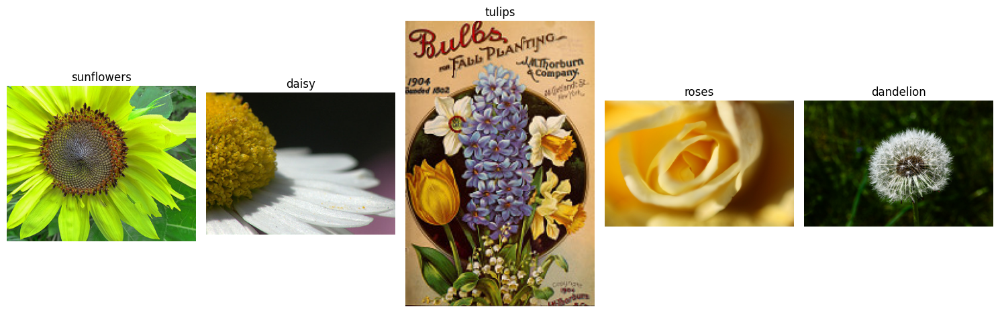

In [156]:
import random
import matplotlib.image as mpimg

plt.figure(figsize=(15, 5))

for i, cls in enumerate(class_names):
    class_path = os.path.join(datasetlocation, cls)

    # List all image files (common extensions)
    img_files = [
        f for f in os.listdir(class_path)
        if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff', '.webp'))
    ]

    if not img_files:
        print(f"No images found in {class_path}")
        continue

    # Pick one random image
    img_file = random.choice(img_files)
    img_path = os.path.join(class_path, img_file)

    # Read and plot
    img = mpimg.imread(img_path)
    plt.subplot(1, len(class_names), i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(cls)
plt.tight_layout()
plt.show()

### Prepare for (one of) the 2 technologies used

In [157]:
if tech_2_use_for_classification=='openai_api':
  from google.colab import userdata
  api_key = userdata.get('OPENAI_API_KEY')
  api_key = api_key.replace("\n", "").replace("\r", "").strip()
  from dotenv import load_dotenv
  import os

  load_dotenv()
  os.environ["OPENAI_API_KEY"] = api_key

In [158]:
if tech_2_use_for_classification=='openai_api':
  from openai import OpenAI

  client = OpenAI()

  def create_file(file_path):
    with open(file_path, "rb") as file_content:
      result = client.files.create(
          file=file_content,
          purpose="vision",
      )
      return result.id


  def predict_class_from_image(img,classnames,num_of_predictions, verbose=False):
        file_id = create_file(img)
        prompt_text = f'Classify these {num_of_predictions} images into classes {classnames}. \
        Provide response in json format like: \
        "classes":["Class1","Class2",...,"ClassN"] \
        Classify images from left to Right, following F pattern. \
        if you cannot classify an image, write "None" class'
        response = client.responses.create(
            model="gpt-4.1-mini",
            input=[{
                "role": "user",
                "content": [
                    {"type": "input_text", "text": prompt_text},
                    {
                        "type": "input_image",
                        "file_id": file_id,
                    },
                ],
            }],
        )
        # if verbose: print(response.output_text)
        return response.output_text

In [159]:
from PIL import Image, ImageDraw
import math
import matplotlib.pyplot as plt

def combine_images(image_paths, output_path="combined.png", max_columns=3, border=5, border_color=(0,0,0), verbose=False):
    """
    Combine multiple images into a grid with optional borders around each image.

    Parameters:
    - image_paths: list of image file paths
    - output_path: where to save the combined image
    - max_columns: max columns in the grid
    - border: thickness of the frame around each image (pixels)
    - border_color: color of the frame (R,G,B)
    - verbose: whether to display the combined image in notebook
    """
    # Load images
    images = [Image.open(p).convert("RGB") for p in image_paths]

    # Optionally resize all images to the same size
    w, h = images[0].size
    images = [img.resize((w, h)) for img in images]

    n = len(images)
    cols = min(max_columns, n)
    rows = math.ceil(n / cols)

    # Create blank canvas, adding border space
    combined = Image.new("RGB", ((w + border) * cols + border, (h + border) * rows + border), (255, 255, 255))

    i = 0
    for row in range(rows):
        for col in range(cols):
            if i >= n:
                break
            x = col * (w + border) + border
            y = row * (h + border) + border
            combined.paste(images[i], (x, y))

            # Draw border/frame
            draw = ImageDraw.Draw(combined)
            draw.rectangle([x-1, y-1, x+w, y+h], outline=border_color, width=border)

            i += 1

    combined.save(output_path)

    # if verbose:
    #     plt.figure(figsize=(10,10))
    #     plt.imshow(combined)
    #     plt.axis('off')
    #     plt.show()

    return output_path


## Main loop

In [168]:
from PIL import Image
from IPython.display import display
import json

def process_image_batch(images_to_merge, class_names, actual, predicted, merged_filename="merged_batch.png", max_columns=3, verbose=False):
    """
    Combines a batch of images, predicts classes using predict_class_from_image,
    updates actual and predicted lists, and prints misclassified images.

    Parameters:
    - images_to_merge: list of tuples (img_path, expected_class)
    - class_names: list of all possible classes
    - actual: list to append actual classes
    - predicted: list to append predicted classes
    - merged_filename: output filename for merged image
    - max_columns: number of columns in the merged grid
    - verbose: whether to print debug info and display the image
    """
    if not images_to_merge:
        return  # nothing to process

    # extract paths and combine images
    img_paths = [x[0] for x in images_to_merge]
    merged_image_path = combine_images(img_paths, merged_filename, max_columns=max_columns, verbose=verbose)

    # predict classes
    pred_response = predict_class_from_image(merged_image_path, class_names, len(img_paths), verbose=verbose)

    # safe parsing
    try:
        if pred_response:  # ensure it's not None or empty
            pred_classes = json.loads(pred_response).get("classes", [])
        else:
            print("Warning: response is empty")
            pred_classes = ["None"] * len(images_to_merge)
    except (json.JSONDecodeError, TypeError) as e:
        print(f"Warning: failed to parse JSON: {e}")
        pred_classes = ["None"] * len(images_to_merge)

    # get actual classes
    actual_batch = [x[1] for x in images_to_merge]
    predicted_batch = pred_classes[:len(actual_batch)]  # truncate if mismatch

    # update global lists
    actual.extend(actual_batch)
    predicted.extend(predicted_batch)

    # print misclassified indices
    show_image = False
    for idx, (a, p) in enumerate(zip(actual_batch, predicted_batch)):
        if a != p:
            show_image = True
            print(f"Image {idx} misclassified: Expected='{a}', Predicted='{p}'")
    if show_image:
        img = Image.open(merged_image_path)  # load the image
        plt.figure(figsize=(10,10))
        plt.imshow(img)
        plt.axis('off')
        plt.show()


classifying: 50 images from class: sunflowers
classifying: 50 images from class: daisy
Image 4 misclassified: Expected='sunflowers', Predicted='None'


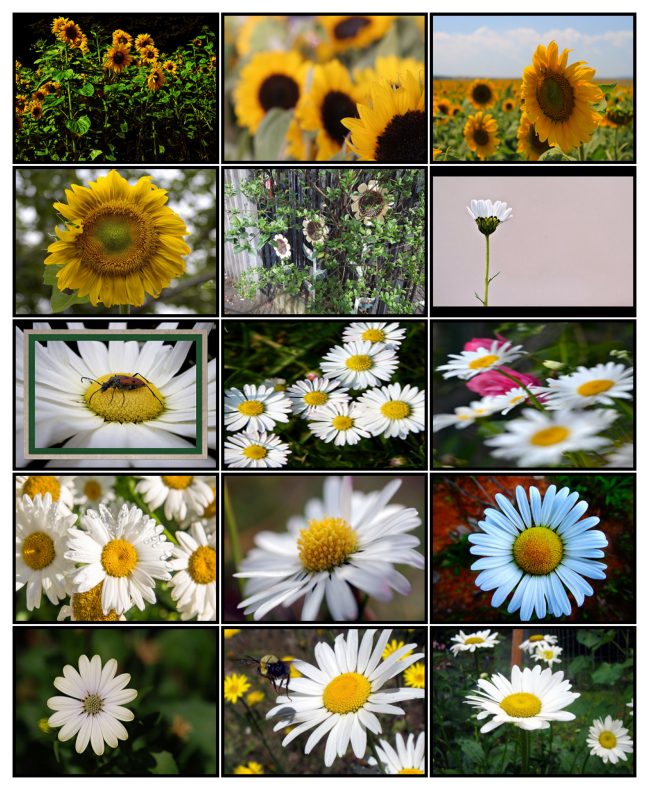

Image 11 misclassified: Expected='daisy', Predicted='None'


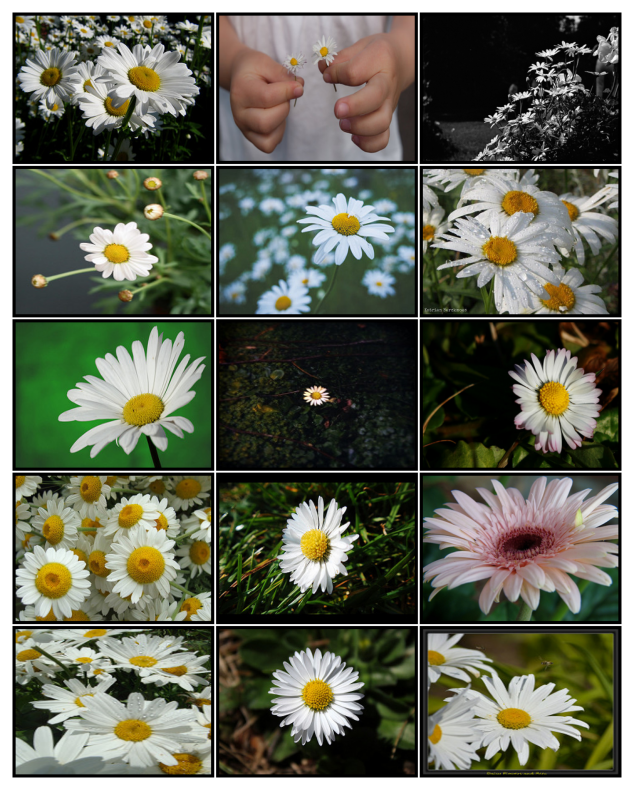

Image 0 misclassified: Expected='daisy', Predicted='None'


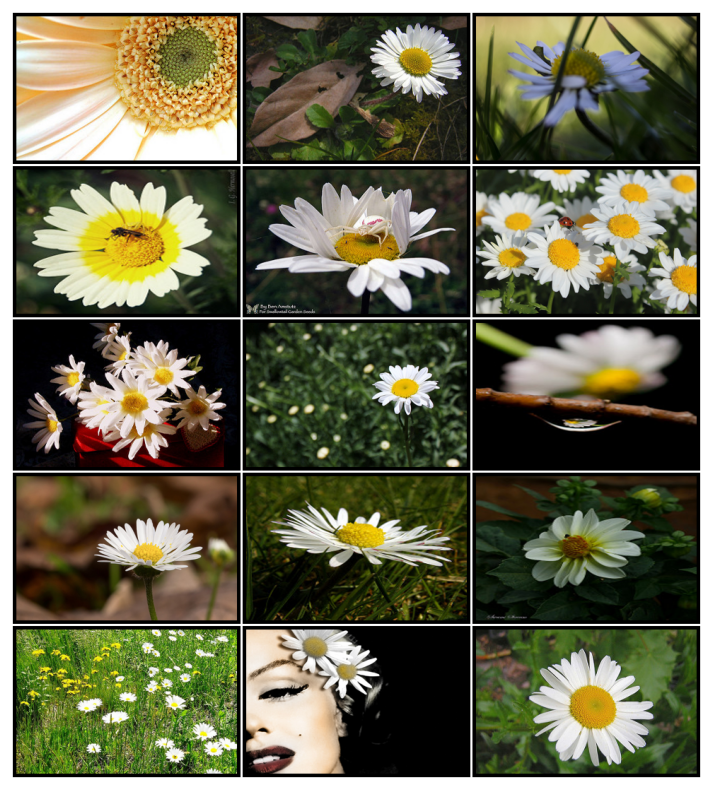

classifying: 50 images from class: tulips
Image 0 misclassified: Expected='tulips', Predicted='None'
Image 1 misclassified: Expected='tulips', Predicted='None'
Image 2 misclassified: Expected='tulips', Predicted='None'
Image 3 misclassified: Expected='tulips', Predicted='None'
Image 4 misclassified: Expected='tulips', Predicted='None'
Image 5 misclassified: Expected='tulips', Predicted='None'
Image 6 misclassified: Expected='tulips', Predicted='None'
Image 7 misclassified: Expected='tulips', Predicted='None'
Image 8 misclassified: Expected='tulips', Predicted='None'
Image 9 misclassified: Expected='tulips', Predicted='None'
Image 10 misclassified: Expected='tulips', Predicted='None'
Image 11 misclassified: Expected='tulips', Predicted='None'
Image 12 misclassified: Expected='tulips', Predicted='None'
Image 13 misclassified: Expected='tulips', Predicted='None'
Image 14 misclassified: Expected='tulips', Predicted='None'


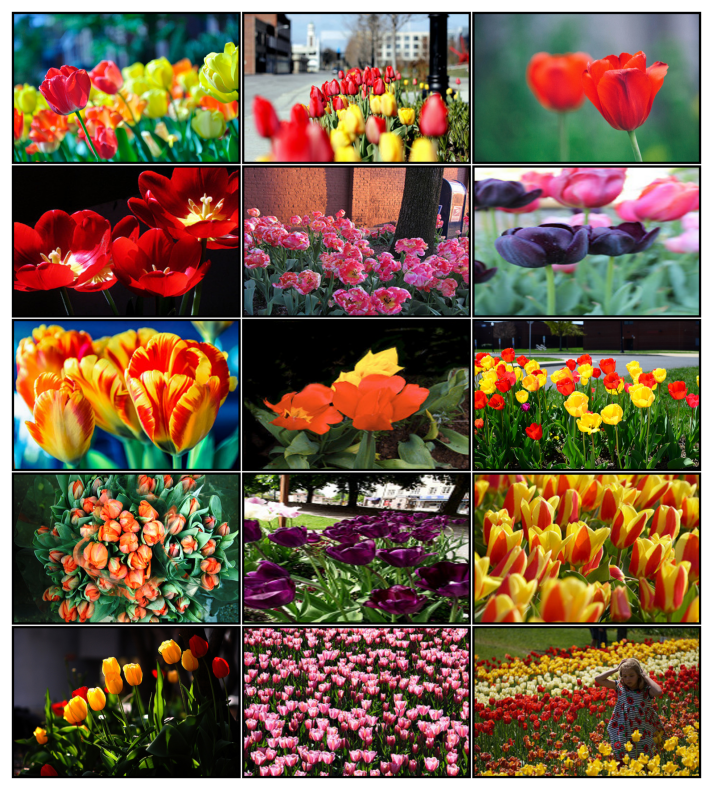

Image 0 misclassified: Expected='tulips', Predicted='None'
Image 2 misclassified: Expected='tulips', Predicted='sunflowers'
Image 3 misclassified: Expected='tulips', Predicted='None'
Image 5 misclassified: Expected='tulips', Predicted='None'


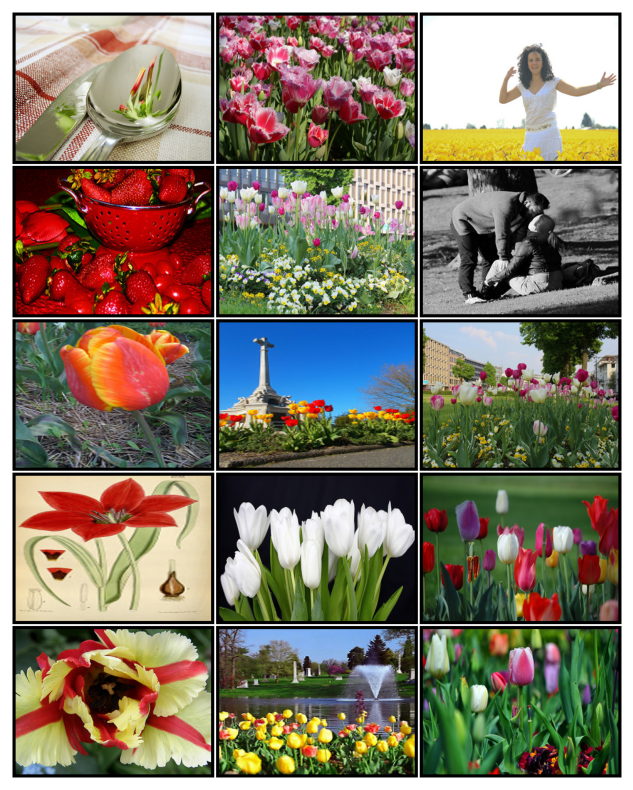

Image 14 misclassified: Expected='tulips', Predicted='None'


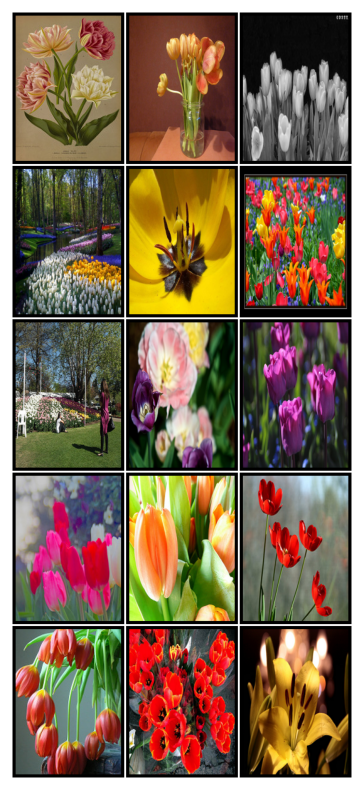

classifying: 50 images from class: roses
Image 13 misclassified: Expected='roses', Predicted='daisy'


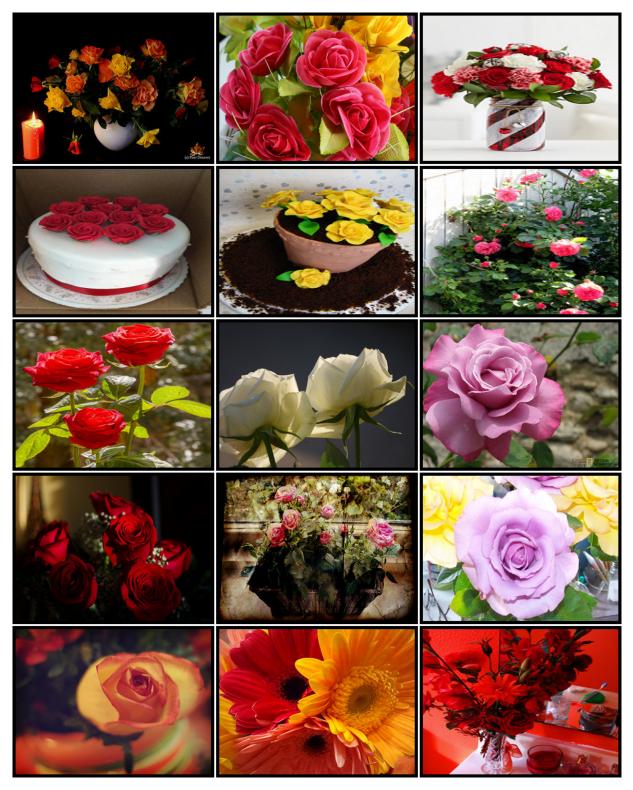

Image 7 misclassified: Expected='roses', Predicted='daisy'


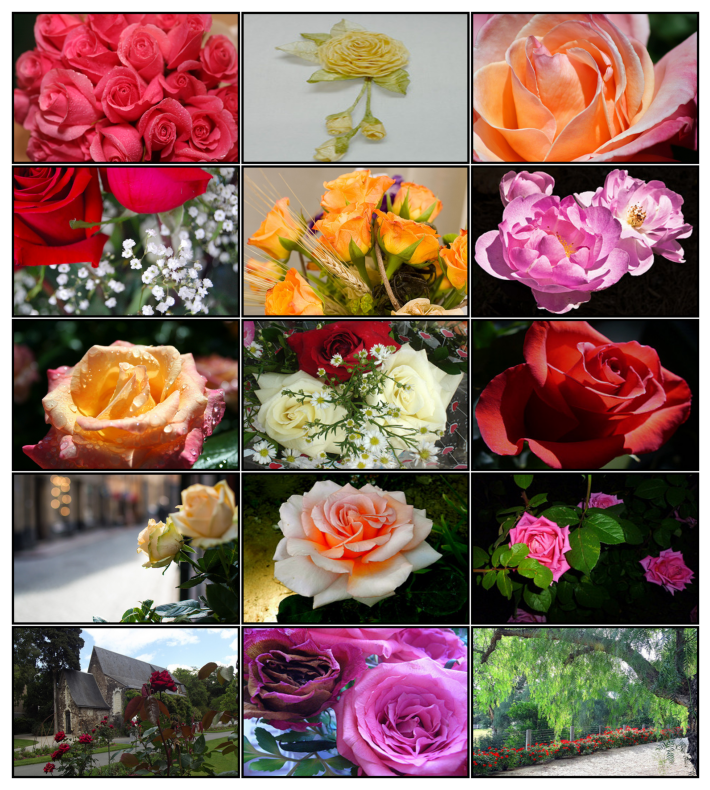

Image 0 misclassified: Expected='roses', Predicted='None'
Image 1 misclassified: Expected='roses', Predicted='None'
Image 4 misclassified: Expected='roses', Predicted='None'
Image 5 misclassified: Expected='roses', Predicted='None'
Image 10 misclassified: Expected='roses', Predicted='None'
Image 14 misclassified: Expected='roses', Predicted='None'


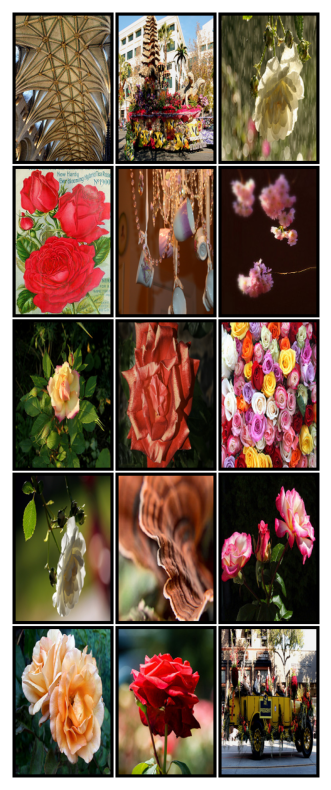

classifying: 50 images from class: dandelion
Image 1 misclassified: Expected='roses', Predicted='None'


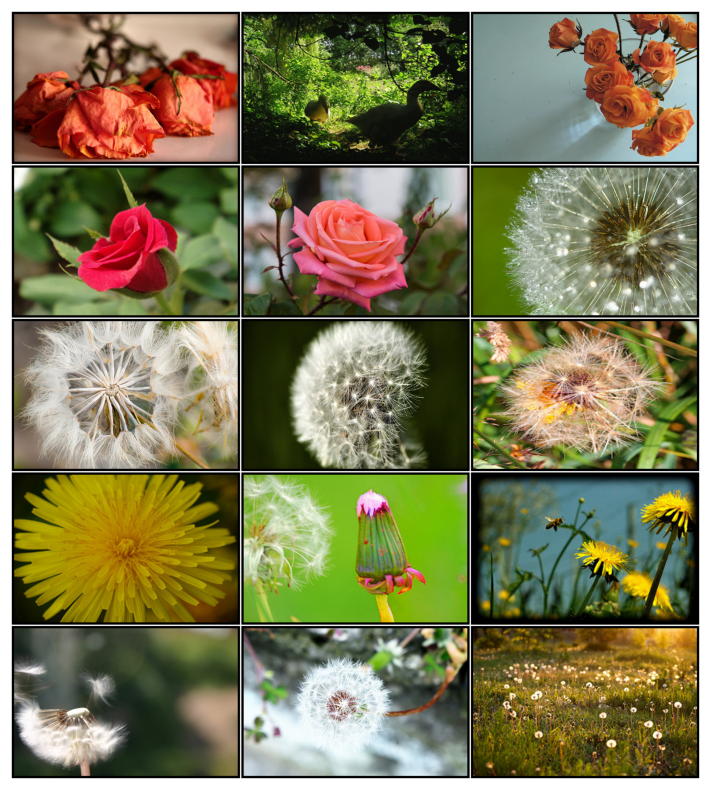

Image 1 misclassified: Expected='dandelion', Predicted='None'


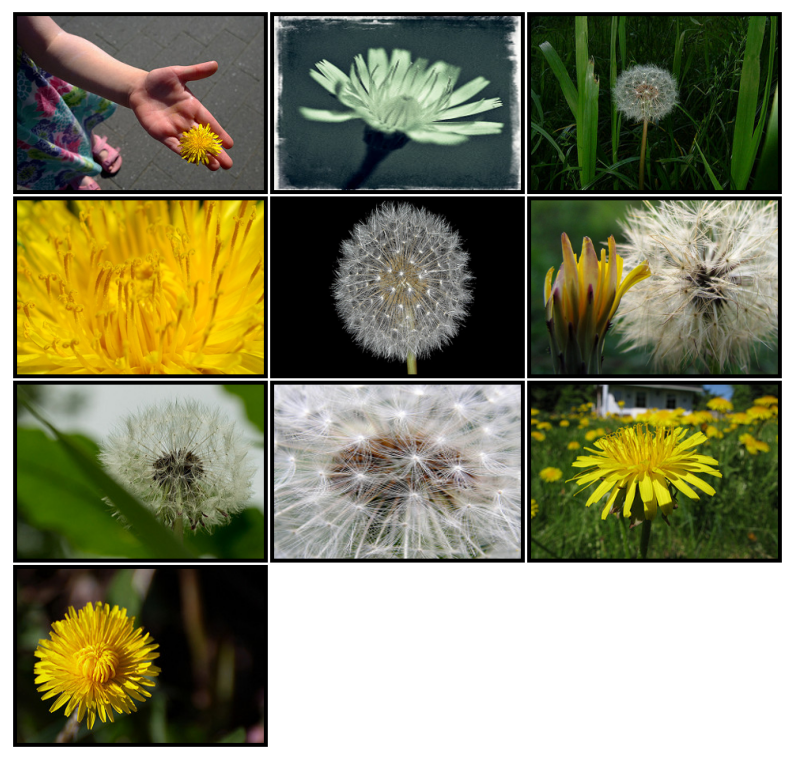

In [169]:
import glob
import os

max_nbr_imgs_per_class = 50
images_to_merge = []
images_per_response = 15
exts = ('*.jpg', '*.jpeg', '*.png', '*.bmp', '*.gif', '*.tiff', '*.webp')

actual = []
predicted = []

for cls in class_names:
    test_imgs = []
    for ext in exts:
        test_imgs.extend(glob.glob(os.path.join(datasetlocation, cls, ext)))

    n_imgs = min(len(test_imgs), max_nbr_imgs_per_class)
    print(f'classifying: {n_imgs} images from class: {cls}')

    for img_path in test_imgs[:max_nbr_imgs_per_class]:

        images_to_merge.append((img_path, cls))

        if len(images_to_merge) == images_per_response:
          process_image_batch(images_to_merge, class_names, actual, predicted, merged_filename="merged_batch.png")
          images_to_merge = []

if images_to_merge:
    process_image_batch(images_to_merge, class_names, actual, predicted, merged_filename="merged_batch_last.png")



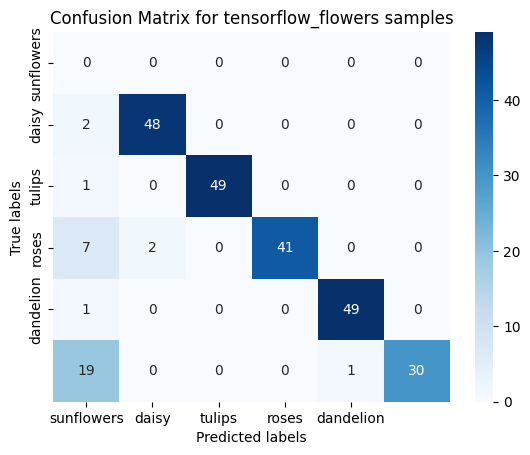

Accuracy: 0.87
F1 score: 0.76


In [170]:
displayPerformanceFigures(actual,predicted,db2use,class_names,includeCF=True)

In [171]:
import pandas as pd

# Define the metrics for each model
model_results = {
    "Model": ["CNN", "CLIP", "OpenAI API"],
    "Accuracy": [0.8842, 0.98, 0.87],
    "F1 Score": [0.8815, 0.98, 0.76]
}

# Create a DataFrame
df = pd.DataFrame(model_results)

# Sort by Accuracy (optional)
df = df.sort_values(by="Accuracy", ascending=False).reset_index(drop=True)

# Display the DataFrame
print("Comparison of Models on Tensor Flowers Dataset:\n")
print(df)

# Optional: highlight the best metrics
best_accuracy = df["Accuracy"].max()
best_f1 = df["F1 Score"].max()

print("\nSummary:")
for idx, row in df.iterrows():
    print(f"{row['Model']}: Accuracy={row['Accuracy']:.4f}, F1 Score={row['F1 Score']:.4f}")

print("\nConclusion:")
if df.loc[0, "Model"] == "CLIP":
    print("CLIP performs the best overall with the highest Accuracy and F1 Score.")
else:
    print(f"{df.loc[0, 'Model']} performs the best overall based on Accuracy and F1 Score.")
print("CNN performs well but is behind CLIP, while OpenAI API has the lowest performance on this dataset.")


Comparison of Models on Tensor Flowers Dataset:

        Model  Accuracy  F1 Score
0        CLIP    0.9800    0.9800
1         CNN    0.8842    0.8815
2  OpenAI API    0.8700    0.7600

Summary:
CLIP: Accuracy=0.9800, F1 Score=0.9800
CNN: Accuracy=0.8842, F1 Score=0.8815
OpenAI API: Accuracy=0.8700, F1 Score=0.7600

Conclusion:
CLIP performs the best overall with the highest Accuracy and F1 Score.
CNN performs well but is behind CLIP, while OpenAI API has the lowest performance on this dataset.


Eventually OPEN AI Api is more suitable for human-reading text, rather than for stable data